# Final Project 

# Written by Michael Po-Hsuan Lin

## Part I: Data Processing

Initial Setup to include dataframe package

In [1]:
# Initial setup
using Pkg;
Pkg.add("DataFrames");

  Updating registry at `/home/jrun/.julia/registries/JuliaPro`
  Updating git-repo `https://pkg.juliacomputing.com/registry/JuliaPro`
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]


In [2]:
using DataFrames;
raw_data = readtable("raw_data.csv");
size(raw_data)

(2387466, 6)

In [3]:
data = raw_data[raw_data.splticrm .!== missing,:];
size(data)

(503108, 6)

Data set decreases insignificantly after adjusting for missing values

In [4]:
size(unique(data.tic),1)

4981

In [5]:
by(data, :tic, size)

,tic,x1
,String⍰,Tuple…
1,AIR,"(242, 6)"
2,4165A,"(157, 6)"
3,ALO.2,"(118, 6)"
4,UDI.,"(16, 6)"
5,AEN.2,"(97, 6)"
6,AAL,"(242, 6)"
7,4267A,"(159, 6)"
8,ASTA,"(7, 6)"
9,ARXX,"(5, 6)"


Data shows that using tic symbol to separate companies may cause inconsistency; as shown above, the lengths are not uniform. Considering the data extract taken from January 1997 to February 2017, there should be 242 data entries and each with 6 columns. In the following analysis and prevent survivor bias/distortion on transition matrix, the inconsistencies are removed. 

In [6]:
selected_index = []
for subdf in groupby(data, :tic)
    if size(subdf,1) === 242
        push!(selected_index,subdf.tic[1])
    end
end
size(selected_index,1)

529

Only 529 companies have complete data from January 1997 to August 2017 out of the 4981 data. More analysis can be done by pushing the time frame closer to 2017. The amount of company having complete data will greatly increase since a lot of large cap tech companies are created after 2000. 

In [7]:
selected_data = data[data.tic .=== selected_index[1],:]
for i in 2:size(selected_index,1)
    temp = data[data.tic .=== selected_index[i],:]
    selected_data = vcat(temp, selected_data)
end
size(selected_data,1)

128018

After some more data cleaning, we can extract the data from the selected 529 companies. Data is restricted down from 503108 to 128018. Now, we can start analyzing the transitions between each months. 

In [8]:
unique(selected_data.datadate)

242-element Array{Union{Missing, Int64},1}:
 19970131
 19970228
 19970331
 19970430
 19970531
 19970630
 19970731
 19970831
 19970930
 19971031
 19971130
 19971231
 19980131
        ⋮
 20160331
 20160430
 20160531
 20160630
 20160731
 20160831
 20160930
 20161031
 20161130
 20161231
 20170131
 20170228

The next step is to replace splticrm ratings with numbers: 
AAA => 22
AA+ => 21
AA => 20
AA- => 19
A+ => 18
A => 17
A- => 16
BBB+ => 15
BBB => 14
BBB- => 13
BB+ => 12
BB => 11
BB- => 10
B+ => 9
B => 8
B- => 7
CCC+ => 6
CCC => 5
CCC- => 4
CC => 3
SD => 2
D => 1

In [9]:
unique(selected_data.splticrm)

22-element Array{Union{Missing, String},1}:
 "AAA" 
 "AA+" 
 "AA"  
 "AA-" 
 "A"   
 "A-"  
 "BBB+"
 "BBB" 
 "BBB-"
 "BB"  
 "BB+" 
 "A+"  
 "B+"  
 "BB-" 
 "B"   
 "B-"  
 "CCC" 
 "D"   
 "CCC+"
 "CC"  
 "SD"  
 "CCC-"

In [10]:
sort!(selected_data, :datadate)

,gvkey,splticrm,datadate,gsector,conm,tic
,Int64⍰,String⍰,Int64⍰,Int64⍰,String⍰,String⍰
1,220940,AAA,19970131,50,ORANGE,ORAN
2,212782,BB,19970131,35,FRESENIUS MEDICAL CARE AG&CO,FMS
3,210216,AA,19970131,50,TELSTRA CORP LTD,TLSYY
4,145348,A-,19970131,55,PPL ELECTRIC UTILITIES CORP,PPL2
5,104831,AA+,19970131,50,SPARK NEW ZEALAND LTD,SPKKY
6,100590,AA+,19970131,55,E.ON SE,EONGY
7,100338,AA-,19970131,20,RELX PLC,RELX
8,100243,A,19970131,15,AMCOR LTD,AMCRY
9,100165,A-,19970131,10,SANTOS LTD,SSLZY


In [11]:
sort!(selected_data, :splticrm)

,gvkey,splticrm,datadate,gsector,conm,tic
,Int64⍰,String⍰,Int64⍰,Int64⍰,String⍰,String⍰
1,100243,A,19970131,15,AMCOR LTD,AMCRY
2,61739,A,19970131,40,HARTFORD FINANCIAL SERVICES,HIG
3,29733,A,19970131,15,MARTIN MARIETTA MATERIALS,MLM
4,28349,A,19970131,40,ALLSTATE CORP,ALL
5,28216,A,19970131,40,REINSURANCE GROUP AMER INC,RGA
6,25157,A,19970131,45,FIRST DATA CORP,FDC
7,16560,A,19970131,15,ALUMINA LTD,AWCMY
8,15620,A,19970131,40,NATIONAL BANK CANADA,NTIOF
9,15305,A,19970131,55,MICHIGAN CONSOLIDATED GAS CO,MCN1


In [12]:
rating_string = selected_data.splticrm;
rating_float = Array{Int64}(undef,(size(rating_string,1),1))
for i in 1:size(rating_string,1)
    if rating_string[i] == "AAA"
        rating_float[i] = 22
    elseif rating_string[i] == "AA+"
        rating_float[i] = 21
    elseif rating_string[i] == "AA"
        rating_float[i] = 20
    elseif rating_string[i] == "AA-"
        rating_float[i] = 19
    elseif rating_string[i] == "A+"
        rating_float[i] = 18
    elseif rating_string[i] == "A"
        rating_float[i] = 17
    elseif rating_string[i] == "A-"
        rating_float[i] = 16
    elseif rating_string[i] == "BBB+"
        rating_float[i] = 15
    elseif rating_string[i] == "BBB"
        rating_float[i] = 14
    elseif rating_string[i] == "BBB-"
        rating_float[i] = 13
    elseif rating_string[i] == "BB+"
        rating_float[i] = 12
    elseif rating_string[i] == "BB"
        rating_float[i] = 11
    elseif rating_string[i] == "BB-"
        rating_float[i] = 10
    elseif rating_string[i] == "B+"
        rating_float[i] = 9
    elseif rating_string[i] == "B"
        rating_float[i] = 8
    elseif rating_string[i] == "B-"
        rating_float[i] = 7
    elseif rating_string[i] == "CCC+"
        rating_float[i] = 6
    elseif rating_string[i] == "CCC"
        rating_float[i] = 5
    elseif rating_string[i] == "CCC-"
        rating_float[i] = 4
    elseif rating_string[i] == "CC"
        rating_float[i] = 3
    elseif rating_string[i] == "SD"
        rating_float[i] = 2
    elseif rating_string[i] == "D"
        rating_float[i] = 1 
    end
end
rating_float

128018×1 Array{Int64,2}:
 17
 17
 17
 17
 17
 17
 17
 17
 17
 17
 17
 17
 17
  ⋮
  1
  1
  1
  1
  2
  2
  2
  2
  2
  2
  2
  2

In [13]:
delete!(selected_data,:splticrm)

,gvkey,datadate,gsector,conm,tic
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰
1,100243,19970131,15,AMCOR LTD,AMCRY
2,61739,19970131,40,HARTFORD FINANCIAL SERVICES,HIG
3,29733,19970131,15,MARTIN MARIETTA MATERIALS,MLM
4,28349,19970131,40,ALLSTATE CORP,ALL
5,28216,19970131,40,REINSURANCE GROUP AMER INC,RGA
6,25157,19970131,45,FIRST DATA CORP,FDC
7,16560,19970131,15,ALUMINA LTD,AWCMY
8,15620,19970131,40,NATIONAL BANK CANADA,NTIOF
9,15305,19970131,55,MICHIGAN CONSOLIDATED GAS CO,MCN1


In [14]:
rating_float = convert(DataFrame, rating_float);
rename!(rating_float, :x1 => :rating)

,rating
,Int64
1,17
2,17
3,17
4,17
5,17
6,17
7,17
8,17
9,17


In [15]:
selected_data = hcat(selected_data, rating_float)

,gvkey,datadate,gsector,conm,tic,rating
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰,Int64
1,100243,19970131,15,AMCOR LTD,AMCRY,17
2,61739,19970131,40,HARTFORD FINANCIAL SERVICES,HIG,17
3,29733,19970131,15,MARTIN MARIETTA MATERIALS,MLM,17
4,28349,19970131,40,ALLSTATE CORP,ALL,17
5,28216,19970131,40,REINSURANCE GROUP AMER INC,RGA,17
6,25157,19970131,45,FIRST DATA CORP,FDC,17
7,16560,19970131,15,ALUMINA LTD,AWCMY,17
8,15620,19970131,40,NATIONAL BANK CANADA,NTIOF,17
9,15305,19970131,55,MICHIGAN CONSOLIDATED GAS CO,MCN1,17


In [16]:
sort!(selected_data,:tic)

,gvkey,datadate,gsector,conm,tic,rating
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰,Int64
1,2316,20061031,15,HEXION INC,0141A,8
2,2316,20061130,15,HEXION INC,0141A,8
3,2316,20061231,15,HEXION INC,0141A,8
4,2316,20070131,15,HEXION INC,0141A,8
5,2316,20070228,15,HEXION INC,0141A,8
6,2316,20070331,15,HEXION INC,0141A,8
7,2316,20070430,15,HEXION INC,0141A,8
8,2316,20070531,15,HEXION INC,0141A,8
9,2316,20070630,15,HEXION INC,0141A,8


## Part II: Rating Change Graph Demonstration

Demonstration of a company's rating changes over the year

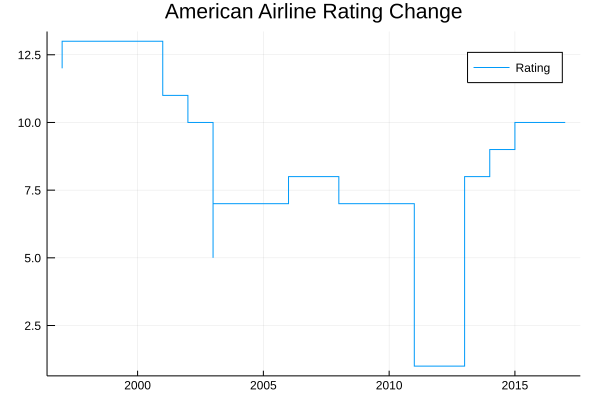

In [17]:
# using StatsPlots
using Plots
# Select American Airline as the example
AAL = DataFrame(selected_data[selected_data.tic .=== "AAL",:]);
sort!(AAL,:datadate)
date = trunc.(Int, AAL.datadate / 10000)
plot(date, AAL.rating, label = "Rating", title = "American Airline Rating Change")

In [80]:
savefig("AAL_rating.png")

## Part III: Single Notch Transitions, Multiple Notch Transitions Percentage

Calculate the percentage of single notch change and multiple notch change

### Part 1: Per company (transitioning between months)

In [18]:
part1_transition_df_with_year_transition = DataFrame(company = String[], singlenotch = Int[], multinotch = Int[], perctmultinotch = Float64[]);
part1_transition_df_without_year_transition = DataFrame(company = String[], singlenotch = Int[], multinotch = Int[], perctmultinotch = Float64[]);
multiple_notch_counter = 0;
single_notch_counter = 0;

The code below counts the transition between each month, including any transition inbetween years.

In [19]:
for subgroup in groupby(selected_data, :tic)
    subgroup = sort(subgroup,:datadate)
    temp_rating = subgroup.rating
    previous = temp_rating[1]
    multiple_notch_counter = 0
    single_notch_counter = 0
    for i in 2:size(temp_rating,1)
        if abs(temp_rating[i] - previous) > 1
            multiple_notch_counter = multiple_notch_counter + 1
        elseif abs(temp_rating[i] - previous) == 1
            single_notch_counter = single_notch_counter + 1
        end
        previous = temp_rating[i]
    end
    perct = multiple_notch_counter / (single_notch_counter + multiple_notch_counter)
    name = subgroup.tic[1]
    push!(part1_transition_df_with_year_transition, [name, single_notch_counter, multiple_notch_counter, perct])
end
part1_transition_df_with_year_transition

,company,singlenotch,multinotch,perctmultinotch
,String,Int64,Int64,Float64
1,0141A,6,3,0.333333
2,0176A,2,0,0.0
3,0191A,4,6,0.6
4,1231B,7,3,0.3
5,3NSRGY,0,1,1.0
6,5672A,3,0,0.0
7,5946B,6,2,0.25
8,6120B,5,2,0.285714
9,8135A,8,0,0.0


In [20]:
println(sum(part1_transition_df_with_year_transition[:,2]))
println(sum(part1_transition_df_with_year_transition[:,3]))

2098
504


This code below counts the transition within the year, excluding cross-year transition; as it turns out, ratings change quite a lot transitioning between years. 

In [21]:
part2_data = selected_data;
temp_year = trunc.(Int, (part2_data.datadate ./ 10000));
year = DataFrame();
year = hcat(year, temp_year);
rename!(year, :x1 => :year);
part2_data = hcat(part2_data, year)

,gvkey,datadate,gsector,conm,tic,rating,year
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰,Int64,Int64
1,2316,20061031,15,HEXION INC,0141A,8,2006
2,2316,20061130,15,HEXION INC,0141A,8,2006
3,2316,20061231,15,HEXION INC,0141A,8,2006
4,2316,20070131,15,HEXION INC,0141A,8,2007
5,2316,20070228,15,HEXION INC,0141A,8,2007
6,2316,20070331,15,HEXION INC,0141A,8,2007
7,2316,20070430,15,HEXION INC,0141A,8,2007
8,2316,20070531,15,HEXION INC,0141A,8,2007
9,2316,20070630,15,HEXION INC,0141A,8,2007


In [22]:
for subgroup in groupby(part2_data, :tic)
    subgroup = sort(subgroup,:datadate)
    temp_rating = subgroup.rating
    temp_year = subgroup.year
    previous = temp_rating[1]
    previous_year = temp_year[1]
    multiple_notch_counter = 0
    single_notch_counter = 0
    for i in 2:size(temp_rating,1)
        if abs(temp_rating[i] - previous) > 1 && temp_year[i] == previous_year
            multiple_notch_counter = multiple_notch_counter + 1
        elseif abs(temp_rating[i] - previous) == 1 && temp_year[i] == previous_year
            single_notch_counter = single_notch_counter + 1
        end
        previous = temp_rating[i]
        previous_year = temp_year[i]
    end
    perct = multiple_notch_counter / (single_notch_counter + multiple_notch_counter)
    name = subgroup.tic[1]
    push!(part1_transition_df_without_year_transition, [name, single_notch_counter, multiple_notch_counter, perct])
end
part1_transition_df_without_year_transition

,company,singlenotch,multinotch,perctmultinotch
,String,Int64,Int64,Float64
1,0141A,5,3,0.375
2,0176A,1,0,0.0
3,0191A,4,6,0.6
4,1231B,6,3,0.333333
5,3NSRGY,0,1,1.0
6,5672A,3,0,0.0
7,5946B,6,2,0.25
8,6120B,5,2,0.285714
9,8135A,8,0,0.0


In [28]:
println(sum(part1_transition_df_without_year_transition[:,2]))
println(sum(part1_transition_df_without_year_transition[:,3]))

1962
470


### Part 2: Over time, Per year

In [36]:
part2_transition_df_without_year_transition = DataFrame(year = Int[1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017], singlenotch = Int[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], multinotch = Int[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], perctmultinotch = Float64[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]);
part2_transition_df_with_year_transition = DataFrame(year = Int[1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017], singlenotch = Int[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], multinotch = Int[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], perctmultinotch = Float64[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]);
overtime_multinotch_counter = 0;
overtime_singlenotch_counter = 0;

For easier processing, create a column of the year

In [37]:
# Still use tic as the separating factor, then slowly accumulate the counter
for subgroup in groupby(part2_data, :tic)
    subgroup = sort(subgroup,:datadate)
    temp_data = DataFrame(subgroup)
    counter = 1
    for subtime in groupby(temp_data, :year)
        temp_rating = subtime.rating
        previous = temp_rating[1]
        overtime_multinotch_counter = 0
        overtime_singlenotch_counter = 0
        for i in 2:size(temp_rating,1)
            if abs(temp_rating[i] - previous) > 1
                overtime_multinotch_counter = overtime_multinotch_counter + 1
            elseif abs(temp_rating[i] - previous) == 1
                overtime_singlenotch_counter = overtime_singlenotch_counter + 1
            end
            previous = temp_rating[i]
        end
        part2_transition_df_without_year_transition[counter,2] = part2_transition_df_without_year_transition[counter,2] + overtime_singlenotch_counter
        part2_transition_df_without_year_transition[counter,3] = part2_transition_df_without_year_transition[counter,3] + overtime_multinotch_counter
        counter = counter + 1
    end
end
part2_transition_df_without_year_transition.perctmultinotch = part2_transition_df_without_year_transition.multinotch ./ (part2_transition_df_without_year_transition.multinotch + part2_transition_df_without_year_transition.singlenotch)
part2_transition_df_without_year_transition

,year,singlenotch,multinotch,perctmultinotch
,Int64,Int64,Int64,Float64
1,1997,84,9,0.0967742
2,1998,90,17,0.158879
3,1999,83,22,0.209524
4,2000,75,33,0.305556
5,2001,87,36,0.292683
6,2002,118,38,0.24359
7,2003,112,30,0.211268
8,2004,72,14,0.162791
9,2005,102,17,0.142857


In [38]:
println(sum(part2_transition_df_without_year_transition[:,2]))
println(sum(part2_transition_df_without_year_transition[:,3]))

1962
470


In [39]:
# Testing ground 
for subgroup in groupby(part2_data, :tic)
    subgroup = sort(subgroup,:datadate)
    A = subgroup[subgroup.year .=== 2017,:]
    println(A)
    break
end

2×7 DataFrame
│ Row │ gvkey  │ datadate │ gsector │ conm       │ tic     │ rating │ year  │
│     │ Int64⍰ │ Int64⍰   │ Int64⍰  │ String⍰    │ String⍰ │ Int64  │ Int64 │
├─────┼────────┼──────────┼─────────┼────────────┼─────────┼────────┼───────┤
│ 1   │ 2316   │ 20170131 │ 15      │ HEXION INC │ 0141A   │ 6      │ 2017  │
│ 2   │ 2316   │ 20170228 │ 15      │ HEXION INC │ 0141A   │ 6      │ 2017  │


To include the cross-year transitions into the next year's transition: for example, 1997 Dec => 1998 Jan, there is a single notch rating change, it will be recorded as a 1998 transition, not 1997 transition. 

In [40]:
for subgroup in groupby(part2_data, :tic)
    subgroup = sort(subgroup,:datadate)
    temp_data = DataFrame(subgroup)
    counter = 1
    init_flag = 0
    previous_year = 0
    for subtime in groupby(temp_data, :year)
        temp_rating = subtime.rating
        previous = temp_rating[1]
        overtime_multinotch_counter = 0
        overtime_singlenotch_counter = 0
        
        if init_flag == 0
            previous_year = temp_rating[end]
        elseif init_flag == 1
            if abs(previous - previous_year) > 1
                overtime_multinotch_counter = overtime_multinotch_counter + 1
            elseif abs(previous - previous_year) == 1
                overtime_singlenotch_counter = overtime_singlenotch_counter + 1
            end
            previous_year = temp_rating[end]
        end
            
        for i in 2:size(temp_rating,1)
            if abs(temp_rating[i] - previous) > 1
                overtime_multinotch_counter = overtime_multinotch_counter + 1
            elseif abs(temp_rating[i] - previous) == 1
                overtime_singlenotch_counter = overtime_singlenotch_counter + 1
            end
            previous = temp_rating[i]
        end
        part2_transition_df_with_year_transition[counter,2] = part2_transition_df_with_year_transition[counter,2] + overtime_singlenotch_counter
        part2_transition_df_with_year_transition[counter,3] = part2_transition_df_with_year_transition[counter,3] + overtime_multinotch_counter
        counter = counter + 1
        init_flag = 1
    end
end
part2_transition_df_with_year_transition.perctmultinotch = part2_transition_df_with_year_transition.multinotch ./ (part2_transition_df_with_year_transition.multinotch + part2_transition_df_with_year_transition.singlenotch)
part2_transition_df_with_year_transition

,year,singlenotch,multinotch,perctmultinotch
,Int64,Int64,Int64,Float64
1,1997,84,9,0.0967742
2,1998,98,17,0.147826
3,1999,94,24,0.20339
4,2000,81,36,0.307692
5,2001,98,40,0.289855
6,2002,127,40,0.239521
7,2003,117,32,0.214765
8,2004,79,14,0.150538
9,2005,106,17,0.138211


In [41]:
println(sum(part2_transition_df_with_year_transition[:,2]))
println(sum(part2_transition_df_with_year_transition[:,3]))

2098
504


### Note that the sum checks for part 1 and part 2 (without year and with year transition) match perfectly. 

### Part IV: Transition Probabilities

Transition probabilities are calculated by year, so we can see how the transition probabilties grow over the years. The following calculation is without cross-year transitions. Incorporating cross-year transition proves to be problematic. 

In [42]:
transition_matrix_array = [];

In [43]:
transition_data = selected_data;
temp_month = trunc.(Int, (transition_data.datadate - (trunc.(Int, (transition_data.datadate ./ 10000)) * 10000)) ./ 100);
month = DataFrame();
month = hcat(year, temp_month);
rename!(month, :x1 => :month);
transition_data = hcat(transition_data, month)

,gvkey,datadate,gsector,conm,tic,rating,year,month
,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰,Int64,Int64,Int64
1,2316,20061031,15,HEXION INC,0141A,8,2006,10
2,2316,20061130,15,HEXION INC,0141A,8,2006,11
3,2316,20061231,15,HEXION INC,0141A,8,2006,12
4,2316,20070131,15,HEXION INC,0141A,8,2007,1
5,2316,20070228,15,HEXION INC,0141A,8,2007,2
6,2316,20070331,15,HEXION INC,0141A,8,2007,3
7,2316,20070430,15,HEXION INC,0141A,8,2007,4
8,2316,20070531,15,HEXION INC,0141A,8,2007,5
9,2316,20070630,15,HEXION INC,0141A,8,2007,6


In [44]:
# Storing data into a total transition matrix just in case
total_transition_matrix = DataFrame()
# A quick creation of transition matrix using for loop
for i in 1:22
    temp = Array([0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])
    total_transition_matrix = hcat(total_transition_matrix, temp)
end
rename!(total_transition_matrix, Dict(:x1 => Symbol("D"), :x1_1 => Symbol("SD"), :x1_2 => Symbol("CC"), :x1_3 => Symbol("CCC-"), :x1_4 => Symbol("CCC"), :x1_5 => Symbol("CCC+"), :x1_6 => Symbol("B-"), :x1_7 => Symbol("B"), :x1_8 => Symbol("B+"), :x1_9 => Symbol("BB-"), :x1_10 => Symbol("BB"), :x1_11 => Symbol("BB+"), :x1_12 => Symbol("BBB-"), :x1_13 => Symbol("BBB"), :x1_14 => Symbol("BBB+"), :x1_15 => Symbol("A-"), :x1_16 => Symbol("A"), :x1_17 => Symbol("A+"), :x1_18 => Symbol("AA-"), :x1_19 => Symbol("AA"), :x1_20 => Symbol("AA+"), :x1_21 => Symbol("AAA")));

In [45]:
summation = 0
sort!(transition_data,:datadate)
for subtime in groupby(transition_data, :year)
    subtime = sort(subtime, :datadate)
    temp_data = DataFrame(subtime)
    
    transition_matrix = DataFrame()
    for i in 1:22
        temp = Array([0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])
        transition_matrix = hcat(transition_matrix, temp)
    end
    rename!(transition_matrix, Dict(:x1 => Symbol("D"), :x1_1 => Symbol("SD"), :x1_2 => Symbol("CC"), :x1_3 => Symbol("CCC-"), :x1_4 => Symbol("CCC"), :x1_5 => Symbol("CCC+"), :x1_6 => Symbol("B-"), :x1_7 => Symbol("B"), :x1_8 => Symbol("B+"), :x1_9 => Symbol("BB-"), :x1_10 => Symbol("BB"), :x1_11 => Symbol("BB+"), :x1_12 => Symbol("BBB-"), :x1_13 => Symbol("BBB"), :x1_14 => Symbol("BBB+"), :x1_15 => Symbol("A-"), :x1_16 => Symbol("A"), :x1_17 => Symbol("A+"), :x1_18 => Symbol("AA-"), :x1_19 => Symbol("AA"), :x1_20 => Symbol("AA+"), :x1_21 => Symbol("AAA")))
    
    for subgroup in groupby(temp_data, :tic)
        temp_rating = subgroup.rating
        previous = temp_rating[1]
        
        for i in 2:size(temp_rating,1)
            transition_matrix[previous,temp_rating[i]] += 1
            total_transition_matrix[previous,temp_rating[i]] += 1
            previous = temp_rating[i]
        end
    end
    
    # Add to the transition_matrix_array
    push!(transition_matrix_array, transition_matrix) 
end
size(transition_matrix_array,1)

21

In [46]:
total_transition_matrix

,D,SD,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,199,0,0,0,0,2,0,7,0,1,1,0,1,0,0,0,0,0,0,0,0,0
2,1,2,0,0,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2,3,28,1,1,2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,2,68,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,3,0,5,0,101,5,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,1,1,2,2,6,383,16,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,2,0,1,0,7,19,1092,24,7,2,0,0,0,1,0,0,0,0,0,0,0,0
8,0,1,2,1,2,3,29,2232,40,7,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,1,0,1,2,11,51,2761,50,7,1,0,0,0,0,0,0,0,0,0,0


In [48]:
transition_matrix_array[2]

,D,SD,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,14,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,19,1,0,0,0,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,1,0,2,117,3,0,0,0,0,0,0,0,0,0,0,0,0


In [49]:
# Testing ground
result = 0
transition = []
for i in 1:21
    for row in 1:size(transition_matrix_array[i],1)
        for column in 1:size(transition_matrix_array[i],1)
            if row != column
                result += transition_matrix_array[i][row,column]
            end
        end
    end
    push!(transition, result)
    result = 0
end
transition

21-element Array{Any,1}:
  93
 107
 105
 108
 123
 156
 142
  86
 119
 123
 139
 151
 163
 121
 133
 109
 115
  92
 114
 123
  10

### The result above matches the transition numbers without cross-year transitions found in previous section 

In [50]:
total_transition_probability_matrix = DataFrame(x1 = [], x1_1 = [], x1_2 = [], x1_3 = [], x1_4 = [], x1_5 = [], x1_6 = [], x1_7 = [], x1_8 = [], x1_9 = [], x1_10 = [], x1_11 = [], x1_12 = [], x1_13 = [], x1_14 = [], x1_15 = [], x1_16 = [], x1_17 = [], x1_18 = [], x1_19 = [], x1_20 = [], x1_21 = []);
rename!(total_transition_probability_matrix, Dict(:x1 => Symbol("D"), :x1_1 => Symbol("SD"), :x1_2 => Symbol("CC"), :x1_3 => Symbol("CCC-"), :x1_4 => Symbol("CCC"), :x1_5 => Symbol("CCC+"), :x1_6 => Symbol("B-"), :x1_7 => Symbol("B"), :x1_8 => Symbol("B+"), :x1_9 => Symbol("BB-"), :x1_10 => Symbol("BB"), :x1_11 => Symbol("BB+"), :x1_12 => Symbol("BBB-"), :x1_13 => Symbol("BBB"), :x1_14 => Symbol("BBB+"), :x1_15 => Symbol("A-"), :x1_16 => Symbol("A"), :x1_17 => Symbol("A+"), :x1_18 => Symbol("AA-"), :x1_19 => Symbol("AA"), :x1_20 => Symbol("AA+"), :x1_21 => Symbol("AAA")));
for row = 1:size(total_transition_matrix,1)
    temp_row = convert(Array, total_transition_matrix[row,:]) / sum(convert(Array, total_transition_matrix[row,:]))
    push!(total_transition_probability_matrix, temp_row)
end
total_transition_probability_matrix

,D,SD,CC,CCC-,CCC,CCC+,B-,B,B+,BB-,BB,BB+,BBB-,BBB,BBB+,A-,A,A+,AA-,AA,AA+,AAA
,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,0.943128,0.0,0.0,0.0,0.0,0.00947867,0.0,0.0331754,0.0,0.00473934,0.00473934,0.0,0.00473934,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.142857,0.285714,0.0,0.0,0.285714,0.285714,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0512821,0.0769231,0.717949,0.025641,0.025641,0.0512821,0.025641,0.025641,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0136986,0.0,0.0273973,0.931507,0.0,0.0136986,0.0136986,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0252101,0.0,0.0420168,0.0,0.848739,0.0420168,0.0420168,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.00240964,0.00240964,0.00481928,0.00481928,0.0144578,0.922892,0.0385542,0.00963855,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0017316,0.0,0.000865801,0.0,0.00606061,0.0164502,0.945455,0.0207792,0.00606061,0.0017316,0.0,0.0,0.0,0.000865801,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.000431593,0.000863185,0.000431593,0.000863185,0.00129478,0.0125162,0.963315,0.0172637,0.00302115,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.00034662,0.0,0.00034662,0.000693241,0.00381282,0.0176776,0.957019,0.017331,0.00242634,0.00034662,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
